# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

In [21]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, datasets

import tests
import os
from tqdm import tqdm

In [58]:
data_dir = 'processed_celeba_small/celeba/'

In [173]:
train_on_gpu = torch.cuda.is_available()

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [59]:
# Compute image normalization
def compute_mean_and_std():
    """
    Compute per-channel mean and std of the dataset (to be used in transforms.Normalize())
    """

    cache_file = "mean_and_std.pt"
    if os.path.exists(cache_file):
        print(f"Reusing cached mean and std")
        d = torch.load(cache_file)

        return d["mean"], d["std"]

    ds = datasets.ImageFolder(
        data_dir, transform=transforms.Compose([transforms.ToTensor()])
    )
    dl = torch.utils.data.DataLoader(
        ds, batch_size=1, num_workers=0
    )

    mean = 0.0
    for images, _ in tqdm(dl, total=len(ds), desc="Computing mean", ncols=80):
        batch_samples = images.size(0)
        images = images.view(batch_samples, images.size(1), -1)
        mean += images.mean(2).sum(0)
    mean = mean / len(dl.dataset)

    var = 0.0
    npix = 0
    for images, _ in tqdm(dl, total=len(ds), desc="Computing std", ncols=80):
        batch_samples = images.size(0)
        images = images.view(batch_samples, images.size(1), -1)
        var += ((images - mean.unsqueeze(1)) ** 2).sum([0, 2])
        npix += images.nelement()

    std = torch.sqrt(var / (npix / 3))

    # Cache results so we don't need to redo the computation
    torch.save({"mean": mean, "std": std}, cache_file)

    return mean, std


In [60]:
mean, std = compute_mean_and_std()

Reusing cached mean and std


In [108]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    
    # Compute mean and std of the dataset
    mean, std = compute_mean_and_std()
    print(f"Dataset mean: {mean}, std: {std}")
    
    # Perform data transformations
    data_transforms = [
        transforms.Resize(size),
        transforms.ToTensor(), 
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
    ]
    
    return transforms.Compose(data_transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [109]:
from torchvision.io import read_image
from PIL import Image

class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
            directory: str, 
            transforms: Callable = None, 
            extension: str = '.jpg'
        ):
        self.directory = directory
        self.transforms = transforms
        self.extension = extension
        
        self.data = datasets.ImageFolder(
            root=self.directory, 
        )

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        n_items = len([name for name in os.listdir(self.directory) if self.extension in name])
        return n_items

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        img_path = os.path.join(
            self.directory, 
            "New Folder With Items",
            str(int(1e6 + index + 1))[1:] + self.extension
        )
        image = Image.open(img_path)
        if self.transforms:
            image = self.transforms(image)
        return image

In [110]:
data = DatasetDirectory(data_dir, get_transforms((64, 64)))

Reusing cached mean and std
Dataset mean: tensor([0.5681, 0.4311, 0.3631]), std: tensor([0.2803, 0.2398, 0.2268])


In [111]:
data.data

Dataset ImageFolder
    Number of datapoints: 57331
    Root location: processed_celeba_small/celeba/

In [112]:
data.__len__()

32600

In [114]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Reusing cached mean and std
Dataset mean: tensor([0.5681, 0.4311, 0.3631]), std: tensor([0.2803, 0.2398, 0.2268])
Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

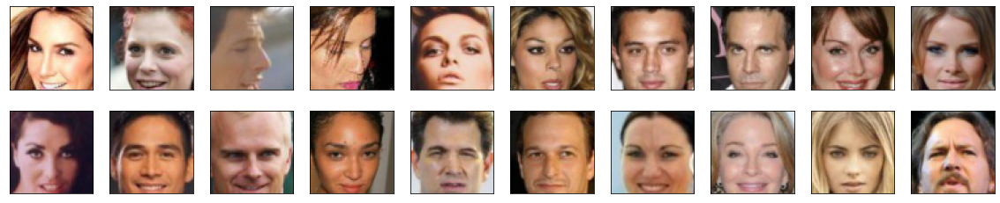

In [115]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [121]:
# from torch.nn import Module
import torch.nn as nn

In [122]:
class ConvBlock(nn.Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(0.2)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [136]:
class Discriminator(nn.Module):
    """
    The discriminator model adapted from the DCGAN paper.
    args:
    - conv_dim: control the number of filters
    """
    def __init__(self, conv_dim: int = 32):
        super(Discriminator, self).__init__()
        
        # 64x64x3 input
        self.conv1 = ConvBlock(3, conv_dim, 4, batch_norm=False) # First layer, no batch_norm
        
        # 32x32x32 input
        self.conv2 = ConvBlock(conv_dim, conv_dim*2, 4)
        
        # 16x16x64 input
        self.conv3 = ConvBlock(conv_dim*2, conv_dim*4, 4)
        
        # 8x8x128 input
        self.conv4 = ConvBlock(conv_dim*4, conv_dim*8, 4)
        # 4x4x256 out
        
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(conv_dim*4*4*4*4, 1)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        
        # Hidden layers + leaky relu activation
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        
        # Flatten
        x = self.flatten(x)
        
        # Final output
        x = self.fc(x)
        
        return x.view(1, 1, 1, -1)

In [137]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [131]:
class DeconvBlock(nn.Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 kernel_size: int, 
                 stride: int,
                 padding: int,
                 batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [186]:
class Generator(nn.Module):
    """
    The Generator model adapted from the DCGAN paper.
    args:
    - latent_dim: dimension of the latent vector
    - conv_dim: control the number of filters
    """
    def __init__(self, latent_dim: int, conv_dim: int = 32):
        super(Generator, self).__init__()
        
        # 4x4x128 input
        self.deconv1 = DeconvBlock(latent_dim, conv_dim * 8, 4, 1, 0)
        
        # 4x4x256 input
        self.deconv2 = DeconvBlock(conv_dim * 8, conv_dim * 4, 4, 2, 1)
        
        # 8x8x128 input
        self.deconv3 = DeconvBlock(conv_dim * 4, conv_dim * 2, 4, 2, 1)
        
        # 16x16x64 input
        self.deconv4 = DeconvBlock(conv_dim * 2, conv_dim, 4, 2, 1)
        
        # 32x32x32
        self.deconv5 = nn.ConvTranspose2d(conv_dim, 3, 4, stride=2, padding=1)
        # 64x64x3 out
        self.last_activation = nn.Tanh()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        
        # Transpose conv layers
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.deconv5(x)
        
        x = self.last_activation(x)
        
        return x

In [187]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [158]:
import torch.optim as optim

def create_optimizers(generator: nn.Module, discriminator: nn.Module):
    """ This function should return the optimizers of the generator and the discriminator """
    
    # Default hyperparameters
    lr=0.0002
    beta1=0.5
    beta2=0.999
    
    # Generator optimizer
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    
    # Discriminator optimizer
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [208]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    
    criterion = nn.BCEWithLogitsLoss()
    
    # Real loss
    labels = torch.ones(fake_logits.size())*0.9
    if train_on_gpu:
        labels = labels.cuda()
    generator_loss = criterion(fake_logits.squeeze(), labels.squeeze())
    
    return generator_loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [217]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """

    criterion = nn.BCEWithLogitsLoss()
    
    # Real loss
    labels = torch.ones(real_logits.size())*0.9
    if train_on_gpu:
        labels = labels.cuda()
    real_loss = criterion(real_logits.squeeze(), labels.squeeze())
    
    # Fake loss
    labels = torch.zeros(fake_logits.size())
    if train_on_gpu:
        labels = labels.cuda()
    fake_loss = criterion(fake_logits.squeeze(), labels.squeeze())
    
    discriminator_loss = real_loss + fake_loss
    
    return discriminator_loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [218]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [219]:
def generator_step(
    batch_size: int, 
    latent_dim: int,
    generator: nn.Module,
    discriminator: nn.Module,
    generator_optimizer: optim.Adam
) -> Dict:
    """ One training step of the generator. """
    
    # Set the gradients to be zeros
    generator_optimizer.zero_grad()
    
    # 1. Generate fake images
    z = torch.randn(batch_size, latent_dim, 1, 1)
    if train_on_gpu:
        z = z.cuda()
    fake_images = generator(z)
    
    # 2. Compute the discriminator losses on the fake images
    # using flipped labels. So how often is the discriminator
    # able to correctly identify whether the image is real or fake
    
    # Fake image entering the discriminator!
    D_fake = discriminator(fake_images)
    g_loss = generator_loss(D_fake)
    
    # 3. Perform backpropagation
    g_loss.backward()
    generator_optimizer.step()
    
    return {'loss': g_loss}


def discriminator_step(
    batch_size: int, 
    latent_dim: int, 
    real_images: torch.Tensor,
    generator: nn.Module,
    discriminator: nn.Module,
    discriminator_optimizer: optim.Adam,
) -> Dict:
    """ One training step of the discriminator. """
    
    # Set the gradients to be zeros
    discriminator_optimizer.zero_grad()
    
    # 1. Generate fake images
    z = torch.randn(batch_size, latent_dim, 1, 1)
    if train_on_gpu:
        z = z.cuda()
        real_images = real_images.cuda()
    fake_images = generator(z)
    
    
    # 2. Compute discriminator loss on fake images
    
    # Real/fake image entering the discriminator!
    D_real = discriminator(real_images)
    D_fake = discriminator(fake_images.detach())
    
    d_loss = discriminator_loss(
        real_logits=D_real,
        fake_logits=D_fake,
    )
    
    # 3. Perform backpropagation
    d_loss.backward()
    discriminator_optimizer.step()
    
    # NOT IMPLEMENTED YET
    gp = 0
    
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [220]:
from datetime import datetime

In [247]:
# you can experiment with different dimensions of latent spaces
latent_dim = 256 # 128

# update to cpu if you do not have access to a gpu
device = 'cuda' if train_on_gpu else 'gpu'

# number of epochs to train your model
n_epochs = 10

# number of images in each batch
batch_size = 64

In [248]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 100

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(
    dataset, 
    batch_size=64, 
    shuffle=True, 
    num_workers=4, 
    drop_last=True,
    pin_memory=False
)

In [251]:
load_model_weights = False
if load_model_weights:
    g_state_dict = torch.load("best_g_loss.pt")
    generator.load_state_dict(g_state_dict)
    
    d_state_dict = torch.load("best_d_loss.pt")
    discriminator.load_state_dict(d_state_dict)

In [252]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2024-02-25 13:06:01 | Epoch [1/10] | Batch 0/509 | d_loss: 2.6633 | g_loss: 0.5425
New minimum generator loss: 0.542453. Saving generator model ...
New minimum discriminator loss: 2.663343. Saving discriminator model ...
2024-02-25 13:06:09 | Epoch [1/10] | Batch 100/509 | d_loss: 1.1342 | g_loss: 1.5731
New minimum discriminator loss: 1.134160. Saving discriminator model ...
2024-02-25 13:06:16 | Epoch [1/10] | Batch 200/509 | d_loss: 1.0436 | g_loss: 2.0909
New minimum discriminator loss: 1.043646. Saving discriminator model ...
2024-02-25 13:06:24 | Epoch [1/10] | Batch 300/509 | d_loss: 0.7334 | g_loss: 2.2125
New minimum discriminator loss: 0.733419. Saving discriminator model ...
2024-02-25 13:06:31 | Epoch [1/10] | Batch 400/509 | d_loss: 1.1551 | g_loss: 1.1765
2024-02-25 13:06:39 | Epoch [1/10] | Batch 500/509 | d_loss: 0.9327 | g_loss: 2.5232


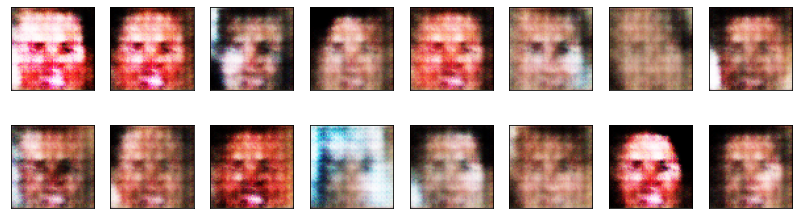

2024-02-25 13:06:43 | Epoch [2/10] | Batch 0/509 | d_loss: 1.2067 | g_loss: 3.8800
2024-02-25 13:06:50 | Epoch [2/10] | Batch 100/509 | d_loss: 0.8108 | g_loss: 2.1360
2024-02-25 13:06:57 | Epoch [2/10] | Batch 200/509 | d_loss: 0.7919 | g_loss: 2.4039
2024-02-25 13:07:05 | Epoch [2/10] | Batch 300/509 | d_loss: 0.8217 | g_loss: 2.0544
2024-02-25 13:07:12 | Epoch [2/10] | Batch 400/509 | d_loss: 0.7226 | g_loss: 2.6615
New minimum discriminator loss: 0.722568. Saving discriminator model ...
2024-02-25 13:07:19 | Epoch [2/10] | Batch 500/509 | d_loss: 0.8910 | g_loss: 2.9534


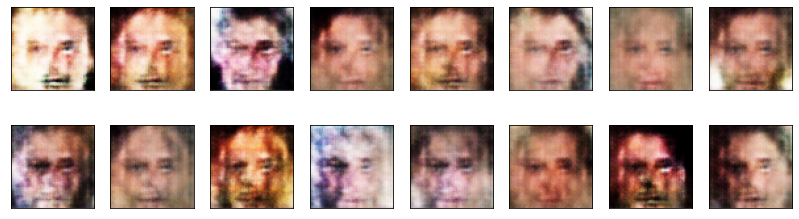

2024-02-25 13:07:23 | Epoch [3/10] | Batch 0/509 | d_loss: 0.8349 | g_loss: 2.1241
2024-02-25 13:07:30 | Epoch [3/10] | Batch 100/509 | d_loss: 0.7776 | g_loss: 2.1978
2024-02-25 13:07:37 | Epoch [3/10] | Batch 200/509 | d_loss: 0.9612 | g_loss: 1.9396
2024-02-25 13:07:44 | Epoch [3/10] | Batch 300/509 | d_loss: 0.8021 | g_loss: 2.4968
2024-02-25 13:07:51 | Epoch [3/10] | Batch 400/509 | d_loss: 0.7471 | g_loss: 2.1079
2024-02-25 13:07:59 | Epoch [3/10] | Batch 500/509 | d_loss: 0.9053 | g_loss: 1.5835


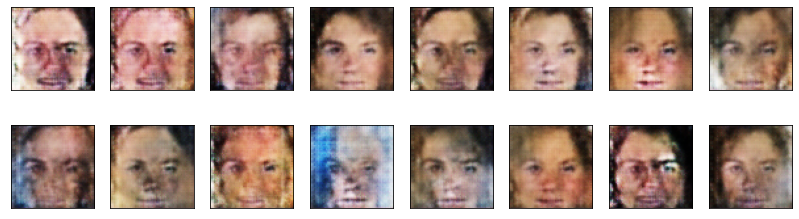

2024-02-25 13:08:03 | Epoch [4/10] | Batch 0/509 | d_loss: 0.8561 | g_loss: 2.0892
2024-02-25 13:08:10 | Epoch [4/10] | Batch 100/509 | d_loss: 0.8257 | g_loss: 2.5119
2024-02-25 13:08:17 | Epoch [4/10] | Batch 200/509 | d_loss: 0.7362 | g_loss: 2.5568
2024-02-25 13:08:25 | Epoch [4/10] | Batch 300/509 | d_loss: 1.1729 | g_loss: 2.7963
2024-02-25 13:08:33 | Epoch [4/10] | Batch 400/509 | d_loss: 0.8497 | g_loss: 2.2089
2024-02-25 13:08:41 | Epoch [4/10] | Batch 500/509 | d_loss: 0.9356 | g_loss: 1.7351


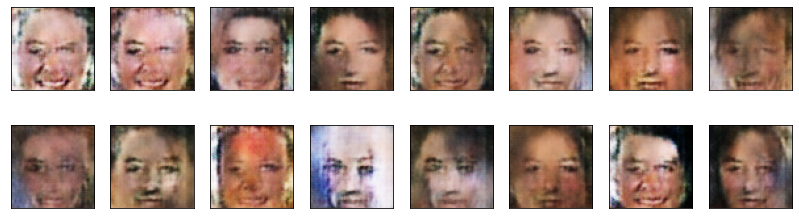

2024-02-25 13:08:45 | Epoch [5/10] | Batch 0/509 | d_loss: 0.7857 | g_loss: 1.8400
2024-02-25 13:08:52 | Epoch [5/10] | Batch 100/509 | d_loss: 1.1040 | g_loss: 1.4003
2024-02-25 13:08:59 | Epoch [5/10] | Batch 200/509 | d_loss: 0.8803 | g_loss: 2.0674
2024-02-25 13:09:07 | Epoch [5/10] | Batch 300/509 | d_loss: 0.8215 | g_loss: 2.5243
2024-02-25 13:09:14 | Epoch [5/10] | Batch 400/509 | d_loss: 0.8281 | g_loss: 1.8988
2024-02-25 13:09:21 | Epoch [5/10] | Batch 500/509 | d_loss: 0.8979 | g_loss: 1.4812


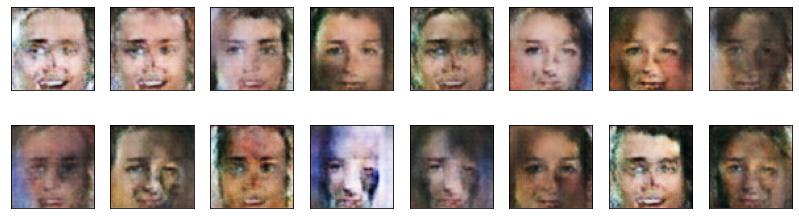

2024-02-25 13:09:26 | Epoch [6/10] | Batch 0/509 | d_loss: 0.9801 | g_loss: 2.8761
2024-02-25 13:09:33 | Epoch [6/10] | Batch 100/509 | d_loss: 0.9851 | g_loss: 1.5666
2024-02-25 13:09:40 | Epoch [6/10] | Batch 200/509 | d_loss: 0.7672 | g_loss: 2.1948
2024-02-25 13:09:48 | Epoch [6/10] | Batch 300/509 | d_loss: 0.8424 | g_loss: 1.4681
2024-02-25 13:09:55 | Epoch [6/10] | Batch 400/509 | d_loss: 0.8203 | g_loss: 1.5544
2024-02-25 13:10:03 | Epoch [6/10] | Batch 500/509 | d_loss: 0.7259 | g_loss: 2.5707


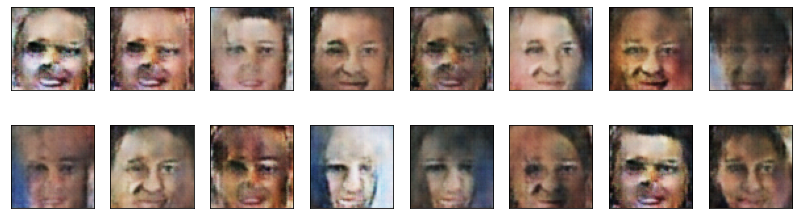

2024-02-25 13:10:07 | Epoch [7/10] | Batch 0/509 | d_loss: 0.7602 | g_loss: 2.4491
2024-02-25 13:10:15 | Epoch [7/10] | Batch 100/509 | d_loss: 1.1100 | g_loss: 3.0849
2024-02-25 13:10:23 | Epoch [7/10] | Batch 200/509 | d_loss: 0.7666 | g_loss: 1.9382
2024-02-25 13:10:31 | Epoch [7/10] | Batch 300/509 | d_loss: 0.8433 | g_loss: 2.4240
2024-02-25 13:10:38 | Epoch [7/10] | Batch 400/509 | d_loss: 0.7243 | g_loss: 2.3284
2024-02-25 13:10:45 | Epoch [7/10] | Batch 500/509 | d_loss: 0.7277 | g_loss: 2.1212


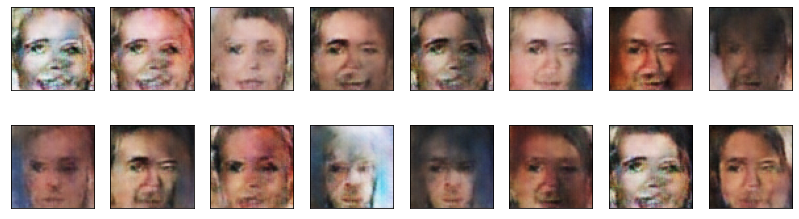

2024-02-25 13:10:49 | Epoch [8/10] | Batch 0/509 | d_loss: 0.7803 | g_loss: 2.2684
2024-02-25 13:10:57 | Epoch [8/10] | Batch 100/509 | d_loss: 0.8320 | g_loss: 2.4479
2024-02-25 13:11:04 | Epoch [8/10] | Batch 200/509 | d_loss: 0.7047 | g_loss: 2.2051
New minimum discriminator loss: 0.704709. Saving discriminator model ...
2024-02-25 13:11:11 | Epoch [8/10] | Batch 300/509 | d_loss: 0.8513 | g_loss: 1.5598
2024-02-25 13:11:19 | Epoch [8/10] | Batch 400/509 | d_loss: 0.8423 | g_loss: 3.2043
2024-02-25 13:11:26 | Epoch [8/10] | Batch 500/509 | d_loss: 0.6503 | g_loss: 2.6569
New minimum discriminator loss: 0.650316. Saving discriminator model ...


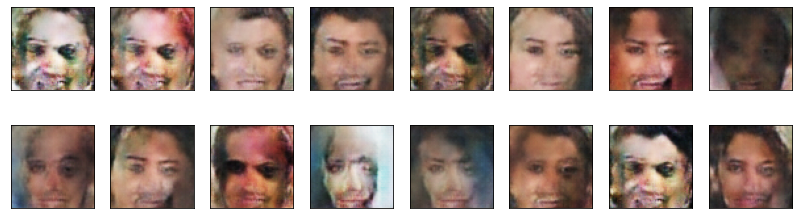

2024-02-25 13:11:31 | Epoch [9/10] | Batch 0/509 | d_loss: 0.8610 | g_loss: 3.3102
2024-02-25 13:11:38 | Epoch [9/10] | Batch 100/509 | d_loss: 0.7414 | g_loss: 1.7988
2024-02-25 13:11:45 | Epoch [9/10] | Batch 200/509 | d_loss: 0.6566 | g_loss: 2.2442
2024-02-25 13:11:52 | Epoch [9/10] | Batch 300/509 | d_loss: 0.8468 | g_loss: 2.3648
2024-02-25 13:12:00 | Epoch [9/10] | Batch 400/509 | d_loss: 0.8304 | g_loss: 2.7705
2024-02-25 13:12:07 | Epoch [9/10] | Batch 500/509 | d_loss: 0.8508 | g_loss: 1.6087


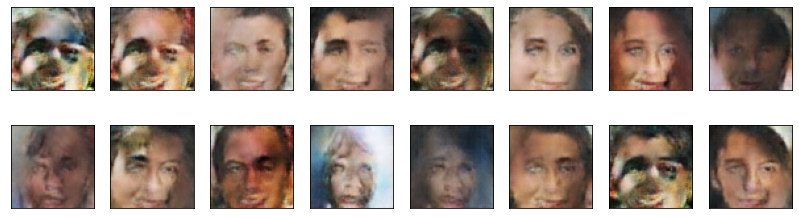

2024-02-25 13:12:11 | Epoch [10/10] | Batch 0/509 | d_loss: 0.7653 | g_loss: 2.6726
2024-02-25 13:12:19 | Epoch [10/10] | Batch 100/509 | d_loss: 0.6697 | g_loss: 2.9817
2024-02-25 13:12:26 | Epoch [10/10] | Batch 200/509 | d_loss: 0.9628 | g_loss: 1.4025
2024-02-25 13:12:34 | Epoch [10/10] | Batch 300/509 | d_loss: 0.6876 | g_loss: 2.0442
2024-02-25 13:12:41 | Epoch [10/10] | Batch 400/509 | d_loss: 0.7633 | g_loss: 2.3198
2024-02-25 13:12:49 | Epoch [10/10] | Batch 500/509 | d_loss: 0.7372 | g_loss: 2.3870


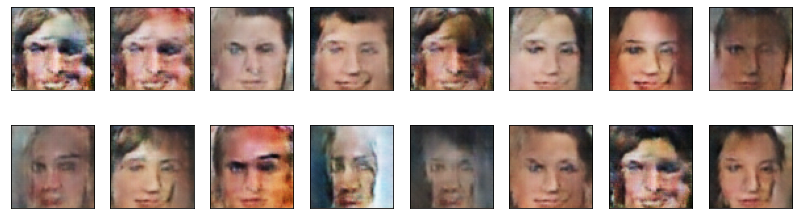

In [253]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
g_loss_min = None
d_loss_min = None
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)      
        
        generator.train()
        discriminator.train()
        
        # =========================================
        #            TRAIN THE GENERATOR
        # =========================================
        
        g_loss = generator_step(
            batch_size, 
            latent_dim,
            generator,
            discriminator,
            g_optimizer,
        )

        # ============================================
        #            TRAIN THE DISCRIMINATOR
        # ============================================
        
        d_loss = discriminator_step(
            batch_size, 
            latent_dim, 
            real_images,
            generator,
            discriminator,
            d_optimizer,
        )
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            curr_d_loss = d_loss['loss'].item()
            curr_g_loss = g_loss['loss'].item()
            losses.append((curr_d_loss, curr_g_loss))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {curr_d_loss:.4f} | g_loss: {curr_g_loss:.4f}')
            
            # ============================================
            #            SAVE MODEL CHECKPOINTS
            # ============================================
            
            # If the generator loss decreases by more than 1%, save the model
            if g_loss_min is None or (
                    (g_loss_min - curr_g_loss) / g_loss_min > 0.01
            ):
                print(f"New minimum generator loss: {curr_g_loss:.6f}. Saving generator model ...")

                # Save the weights to save_path
                torch.save(generator.state_dict(), "best_g_loss.pt")

                g_loss_min = curr_g_loss
            
            # If the discriminator loss decreases by more than 1%, save the model
            if d_loss_min is None or (
                    (d_loss_min - curr_d_loss) / d_loss_min > 0.01
            ):
                print(f"New minimum discriminator loss: {curr_d_loss:.6f}. Saving discriminator model ...")

                # Save the weights to save_path
                torch.save(discriminator.state_dict(), "best_d_loss.pt")

                d_loss_min = curr_d_loss
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

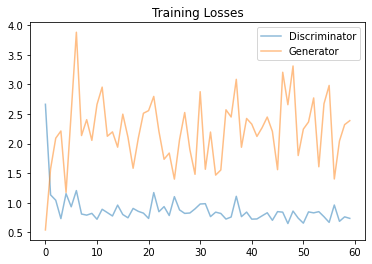

In [254]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:**

The model is able to generate images of faces, but they still look a bit artificial. It's good at making a basic face representation, but it struggles with adding realistic details. The images lack finer details that make a face look real. Humans can easily tell that these images are not genuine. One could also notice that the model is biased as most of the faces it creates resemble white male celebrities.

To make the model better, we have a few options. First, we could train it on a bigger dataset with more diverse faces. Also, we could make the model more complex by adding more convolutional layers to the generator of the images and more deconvolutional layers to the discriminator to better judge if they're real or fake.

Another idea is to use transfer learning. Instead of starting from scratch, we could use a pre-trained model and fine-tune it for our task. StyleGAN is a good example of this. It's known for creating high-quality face images, so it might help our model make better faces too.

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.